# MAKERERE FRUIT PASSION EDA

In [2]:


import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# import useful tools
from glob import glob
from PIL import Image
import cv2

# import data visualization
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns

from bokeh.plotting import figure
from bokeh.io import output_notebook, show, output_file
from bokeh.models import ColumnDataSource, HoverTool, Panel
from bokeh.models.widgets import Tabs

# import data augmentation
import albumentations as albu



## Reproducibility

In [ ]:


warnings.simplefilter('ignore')
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True

seed_everything(47)




## Global Wheat Detection Competition EDA

Detection of passion fruit and its diseases with computer vision opens a lot of opportunity for the farmers and breeders like:



In this notebook I am exploring the data and giving some thoughts on what to pay attention when making and validating the models.


### The number of train and test images 

In [5]:
# Setup the paths to train and test images
TRAIN_DIR = '../input/makerere-fruit-passion/New Makerere/Train_Images(1)/Train_Images/'
TEST_DIR = '../input/makerere-fruit-passion/New Makerere/Test_Images(1)/Test_Images/'
TRAIN_CSV_PATH = '../input/makerere-fruit-passion/New Makerere/Train(1).csv'

# Glob the directories and get the lists of train and test images
train_fns = glob(TRAIN_DIR + '*')
test_fns = glob(TEST_DIR + '*')

In [6]:
print('Number of train images is {}'.format(len(train_fns)))
print('Number of test images is {}'.format(len(test_fns)))

Number of train images is 3001
Number of test images is 931


#### Just 3001 images for the training seems to be not much at all. Data augmentation techniques will be definetely required in this competition.


## The No of bounding boxes

In [9]:
# Load the dataframe with the bounding boxes
train = pd.read_csv(TRAIN_CSV_PATH)

# Create a dataframe with all train images
all_train_images = pd.DataFrame([fns.split('/')[-1][:-4] for fns in train_fns])
all_train_images.columns=['Image_ID']

# Merge all train images with the bounding boxes dataframe
all_train_images = all_train_images.merge(train, on='Image_ID', how='left')



In [11]:
print('{} images without passion fruit.'.format(len(all_train_images) - len(train)))

0 images without passion fruit.


## Visualization

In [16]:
def get_all_bboxes(df, image_id):
    image_bboxes = df[df.Image_ID == image_id]
    
    bboxes = []
    for _,row in image_bboxes.iterrows():
        bboxes.append((row.xmin, row.ymin, row.width, row.height))
        
    return bboxes

def plot_image_examples(df, rows=3, cols=3, title='Image examples'):
    fig, axs = plt.subplots(rows, cols, figsize=(10,10))
    for row in range(rows):
        for col in range(cols):
            idx = np.random.randint(len(df), size=1)[0]
            img_id = df.iloc[idx].Image_ID
            
            img = Image.open(TRAIN_DIR + img_id + '.jpg')
            axs[row, col].imshow(img)
            
            bboxes = get_all_bboxes(df, img_id)
            
            for bbox in bboxes:
                rect = patches.Rectangle((bbox[0],bbox[1]),bbox[2],bbox[3],linewidth=1,edgecolor='r',facecolor='none')
                axs[row, col].add_patch(rect)
            
            axs[row, col].axis('off')
            
    plt.suptitle(title)


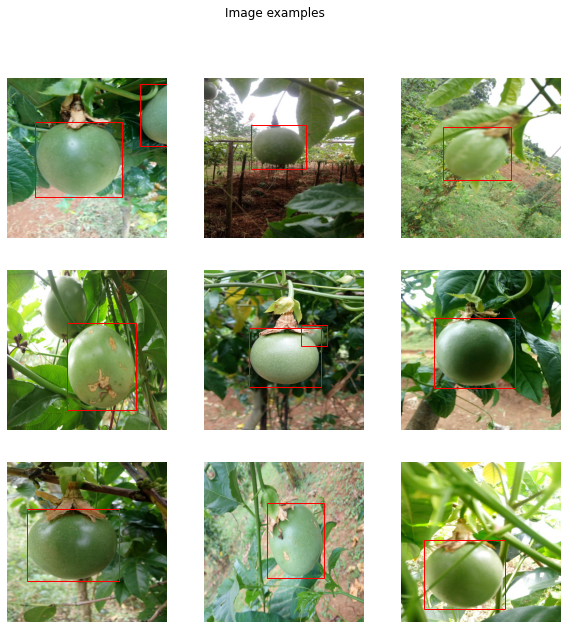

In [17]:
plot_image_examples(all_train_images)

## What can we see
* Images taken at different light conditions
* Images taken at different proximity
* Some images have multiple bounding boxes


## Count number of bounding boxes per image

In [18]:
# compute the number of bounding boxes per train image
all_train_images['count'] = all_train_images.apply(lambda row: 1 if np.isfinite(row.width) else 0, axis=1)
train_images_count = all_train_images.groupby('Image_ID').sum().reset_index()

In [19]:


# See this article on how to plot bar charts with Bokeh:
# https://towardsdatascience.com/interactive-histograms-with-bokeh-202b522265f3
def hist_hover(dataframe, column, colors=["#94c8d8", "#ea5e51"], bins=30, title=''):
    hist, edges = np.histogram(dataframe[column], bins = bins)
    
    hist_df = pd.DataFrame({column: hist,
                             "left": edges[:-1],
                             "right": edges[1:]})
    hist_df["interval"] = ["%d to %d" % (left, right) for left, 
                           right in zip(hist_df["left"], hist_df["right"])]

    src = ColumnDataSource(hist_df)
    plot = figure(plot_height = 400, plot_width = 600,
          title = title,
          x_axis_label = column,
          y_axis_label = "Count")    
    plot.quad(bottom = 0, top = column,left = "left", 
        right = "right", source = src, fill_color = colors[0], 
        line_color = "#35838d", fill_alpha = 0.7,
        hover_fill_alpha = 0.7, hover_fill_color = colors[1])
        
    hover = HoverTool(tooltips = [('Interval', '@interval'),
                              ('Count', str("@" + column))])
    plot.add_tools(hover)
    
    output_notebook()
    show(plot)



In [20]:
hist_hover(train_images_count, 'count', title='Number of Passionfruits per image')

Loading BokehJS ...

### Plot images with more than 1 bounding boxes

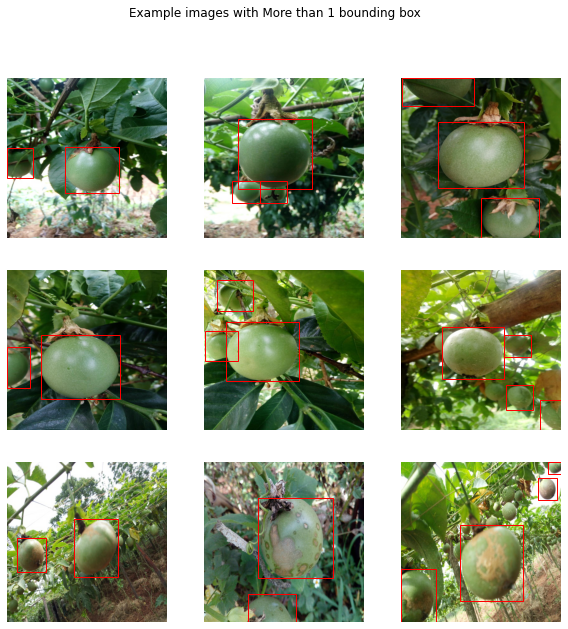

In [22]:
many_spikes_ids = train_images_count[train_images_count['count'] > 1].Image_ID
plot_image_examples(all_train_images[all_train_images.Image_ID.isin(many_spikes_ids)], title='Example images with More than 1 bounding box')

### Plot images with 1 bounding box

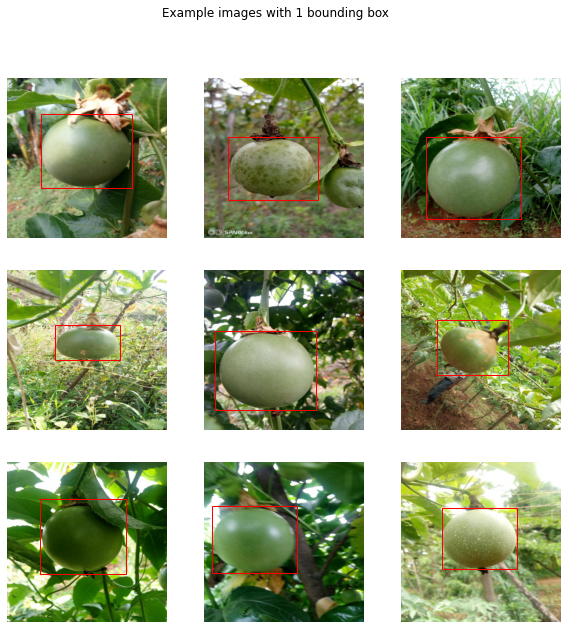

In [23]:
many_spikes_ids = train_images_count[train_images_count['count'] < 2].Image_ID
plot_image_examples(all_train_images[all_train_images.Image_ID.isin(many_spikes_ids)], title='Example images with 1 bounding box')

### Plot a histogram of bounding boxes

In [25]:
# compute bounding box areas
all_train_images['bbox_area'] = all_train_images['width'] * all_train_images['height']

In [26]:
# plot a histogram of bounding box areas
hist_hover(all_train_images, 'bbox_area', title='Area of a single bounding box')

Loading BokehJS ...

#### Kinda skewed to the right

In [28]:
# Maximum are of the bounding boxes
all_train_images.bbox_area.max()

189225.75

#### Visualize the large area bounding boxes
Why because the Distribution above is right skewed

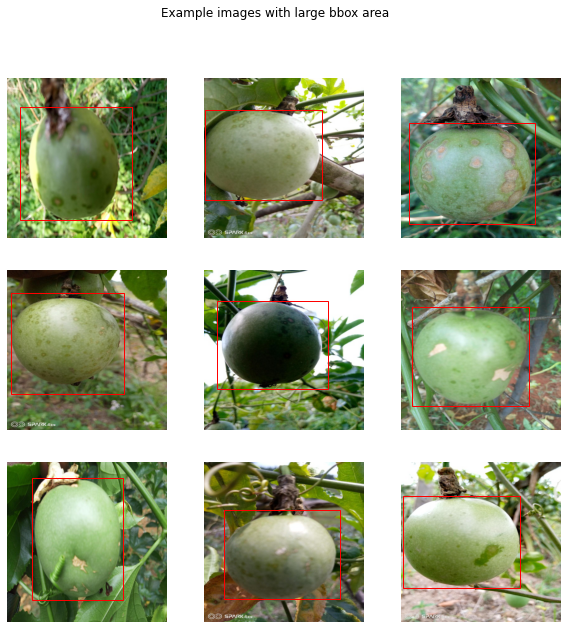

In [30]:
large_boxes_ids = all_train_images[all_train_images['bbox_area'] > 100000].Image_ID
plot_image_examples(all_train_images[all_train_images.Image_ID.isin(large_boxes_ids)], title='Example images with large bbox area')

#### Everything seems okay 

### Lets look at small bouunding boxes

In [31]:
min_area = all_train_images[all_train_images['bbox_area'] > 0].bbox_area.min()
print('The smallest bounding box area is {}'.format(min_area))

The smallest bounding box area is 1.75


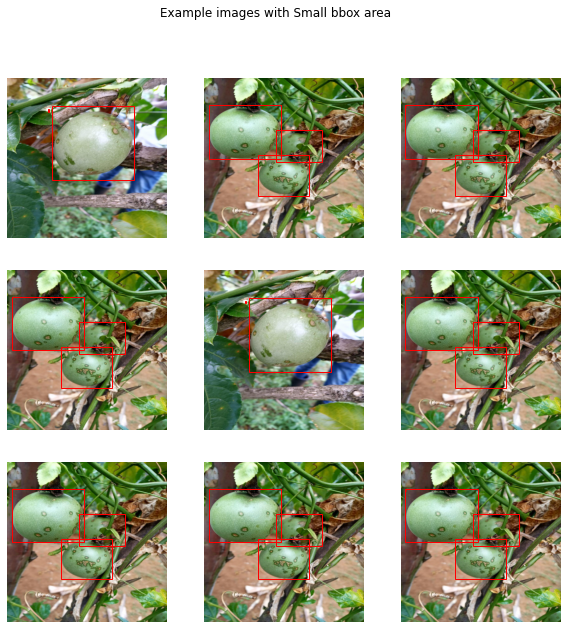

In [32]:
small_boxes_ids = all_train_images[(all_train_images['bbox_area'] < 50) & (all_train_images['bbox_area'] > 0)].Image_ID
plot_image_examples(all_train_images[all_train_images.Image_ID.isin(small_boxes_ids)], title='Example images with Small bbox area')

#### No anormalies but some are overlapping

### Area of bounding boxes per image

In [33]:


Image.open('../input/makerere-fruit-passion/New Makerere/Train_Images(1)/Train_Images/ID_00WROUT9.jpg').size

(512, 512)

In [34]:
# compute the total bounding boxes area per image
area_per_image = all_train_images.groupby(by='Image_ID').sum().reset_index()

# compute the percentage of the image area covered by bounding boxes
area_per_image_percentage = area_per_image.copy()
area_per_image_percentage['bbox_area'] = area_per_image_percentage['bbox_area'] / (512*512) * 100

In [35]:
hist_hover(area_per_image_percentage, 'bbox_area', title='Percentage of image area covered by bounding boxes')

Loading BokehJS ...

#### What can you see
* Close to normal distribution where 10-38% of the image area is covered by bounding boxes
* This observation can be used to validate the predictions of the resulting model. The percentage of predicted bounding boxes area should be normally distributed too.
* We can also see that the maximum is actually greater than 100%. This means that the bounding boxes are overlapping.

### Let's look at some examples of images with small areas covered by bounding boxes

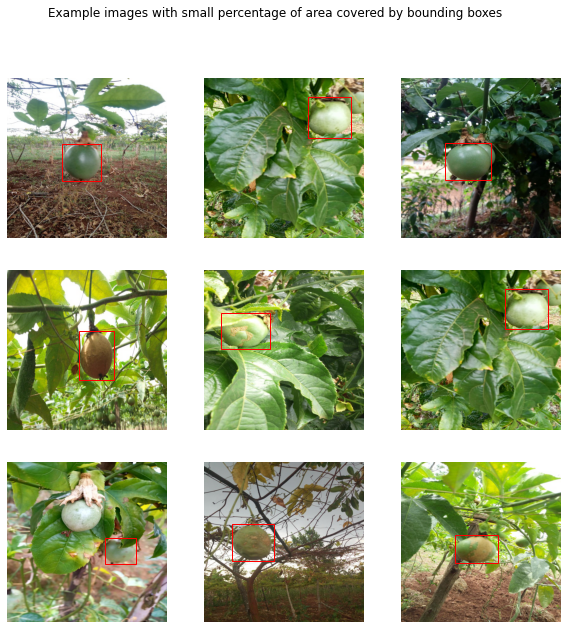

In [37]:
small_area_perc_ids = area_per_image_percentage[area_per_image_percentage['bbox_area'] < 7].Image_ID
plot_image_examples(all_train_images[all_train_images.Image_ID.isin(small_area_perc_ids)], title='Example images with small percentage of area covered by bounding boxes')

### Let's look at some examples of images with LARGE areas covered by bounding boxes

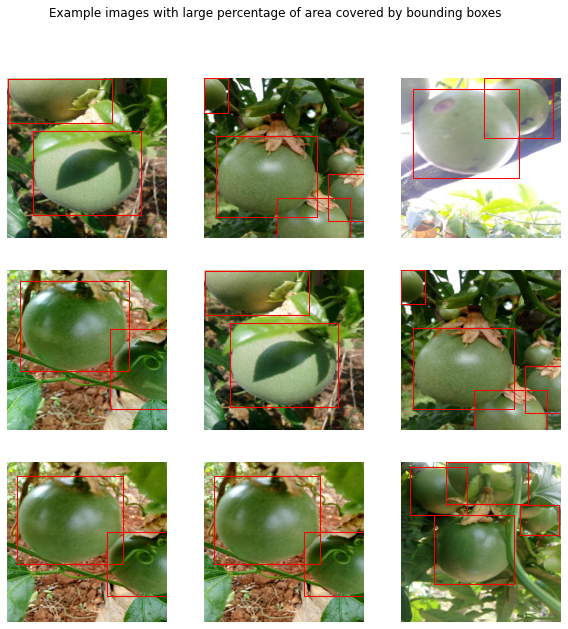

In [39]:
large_area_perc_ids = area_per_image_percentage[area_per_image_percentage['bbox_area'] > 50].Image_ID
plot_image_examples(all_train_images[all_train_images.Image_ID.isin(large_area_perc_ids)], title='Example images with large percentage of area covered by bounding boxes')

### The Brightness of the Images

In [40]:
def get_image_brightness(image):
    # convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # get average brightness
    return np.array(gray).mean()

def add_brightness(df):
    brightness = []
    for _, row in df.iterrows():
        img_id = row.Image_ID  
        image = cv2.imread(TRAIN_DIR + img_id + '.jpg')
        brightness.append(get_image_brightness(image))
        
    brightness_df = pd.DataFrame(brightness)
    brightness_df.columns = ['brightness']
    df = pd.concat([df, brightness_df], ignore_index=True, axis=1)
    df.columns = ['Image_ID', 'brightness']
    
    return df



In [41]:


images_df = pd.DataFrame(all_train_images.Image_ID.unique())
images_df.columns = ['Image_ID']

In [42]:
# add brightness to the dataframe
images_df = pd.DataFrame(all_train_images.Image_ID.unique())
images_df.columns = ['Image_ID']
brightness_df = add_brightness(images_df)

all_train_images = all_train_images.merge(brightness_df, on='Image_ID')


In [45]:
hist_hover(all_train_images, 'brightness', title='Images brightness distribution')

Loading BokehJS ...

#### What do you see
* Normal distribution

### Plot the darkest images

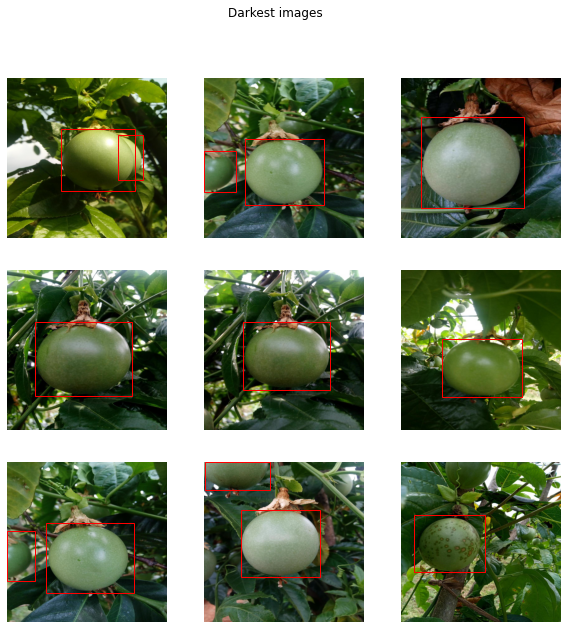

In [46]:
dark_ids = all_train_images[all_train_images['brightness'] < 80].Image_ID
plot_image_examples(all_train_images[all_train_images.Image_ID.isin(dark_ids)], title='Darkest images')

#### They are not so dark but a bit shadowy

### Plot the brightest images

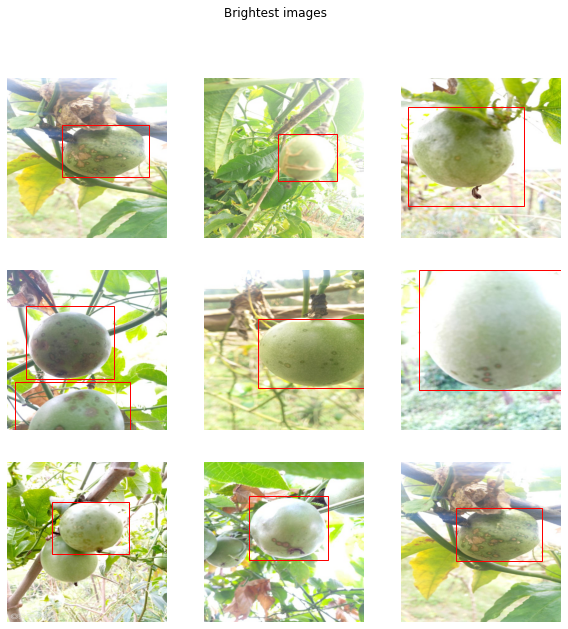

In [48]:
bright_ids = all_train_images[all_train_images['brightness'] > 180].Image_ID
plot_image_examples(all_train_images[all_train_images.Image_ID.isin(bright_ids)], title='Brightest images')

#### In some the sun flare is so bright you need some filters to represent this 

### The most and the least green and yellow images:
I would like to plot images with different dominant colors. The idea is that the most green images will represent healthy fruits. The most yellow images and brown will represent unhealthy fruits.

In [49]:
def get_percentage_of_green_pixels(image):
    # convert to HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    
    # get the green mask
    hsv_lower = (40, 40, 40) 
    hsv_higher = (70, 255, 255)
    green_mask = cv2.inRange(hsv, hsv_lower, hsv_higher)
    
    return float(np.sum(green_mask)) / 255 / (1024 * 1024)

def get_percentage_of_yellow_pixels(image):
    # convert to HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    
    # get the green mask
    hsv_lower = (25, 40, 40) 
    hsv_higher = (35, 255, 255)
    yellow_mask = cv2.inRange(hsv, hsv_lower, hsv_higher)
    
    return float(np.sum(yellow_mask)) / 255 / (1024 * 1024)

def add_green_pixels_percentage(df):
    green = []
    for _, row in df.iterrows():
        img_id = row.Image_ID  
        image = cv2.imread(TRAIN_DIR + img_id + '.jpg')
        green.append(get_percentage_of_green_pixels(image))
        
    green_df = pd.DataFrame(green)
    green_df.columns = ['green_pixels']
    df = pd.concat([df, green_df], ignore_index=True, axis=1)
    df.columns = ['Image_ID', 'green_pixels']
    
    return df

def add_yellow_pixels_percentage(df):
    yellow = []
    for _, row in df.iterrows():
        img_id = row.Image_ID 
        image = cv2.imread(TRAIN_DIR + img_id + '.jpg')
        yellow.append(get_percentage_of_yellow_pixels(image))
        
    yellow_df = pd.DataFrame(yellow)
    yellow_df.columns = ['yellow_pixels']
    df = pd.concat([df, yellow_df], ignore_index=True, axis=1)
    df.columns = ['Image_ID', 'yellow_pixels']
    
    return df

In [51]:
# add a column with the percentage of green pixels
green_pixels_df = add_green_pixels_percentage(images_df)
all_train_images = all_train_images.merge(green_pixels_df, on='Image_ID')

In [52]:
hist_hover(all_train_images, 'green_pixels', title='Percentage of green pixels distribution', colors=['#c3ea84', '#3e7a17'])

Loading BokehJS ...



Surprisingly, the most green images have only aoung 20% green pixels.

The majority of the images are not green at all! Most probably, they are more yellow/BROWN and are the images of the fruits close to harvest.


### Lets visualize the green fruits


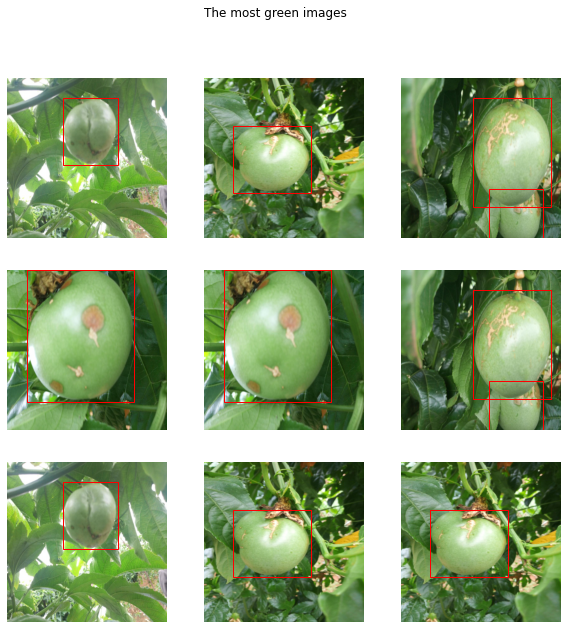

In [54]:
green_ids = all_train_images[all_train_images['green_pixels'] > 0.2].Image_ID
plot_image_examples(all_train_images[all_train_images.Image_ID.isin(green_ids)], title='The most green images')

### Yellow images 

In [55]:
# add a column with the percentage of yellow pixels
yellow_pixels_df = add_yellow_pixels_percentage(images_df)
all_train_images = all_train_images.merge(yellow_pixels_df, on='Image_ID')

In [56]:
hist_hover(all_train_images, 'yellow_pixels', title='Percentage of yellow pixels distribution', colors=['#fffedb', '#fffeab'])

Loading BokehJS ...

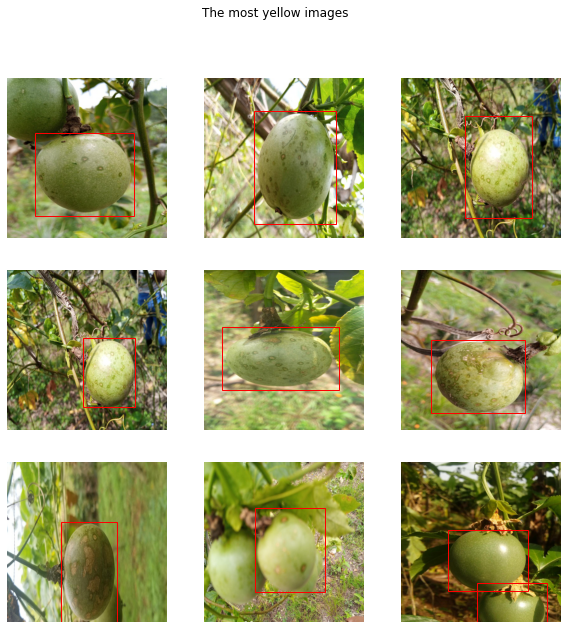

In [57]:
yellow_ids = all_train_images[all_train_images['yellow_pixels'] >0.1].Image_ID
plot_image_examples(all_train_images[all_train_images.Image_ID.isin(yellow_ids)], title='The most yellow images')


#### We can actually see that not most images are yellow|

## THOUGHTS ON DATA AUGMENTATION

Data augmentation is critical in this competition, because there is a relatively small training set. Data augmentation will allow to build robust models under given circumstances.
* What augmentations/filers might work:

    flipping images horizontally and vertically, because the orientation of original images is different;
    
    crop-resize, because we can see fruits at different zoom levels;
    
    different filters to adjust the lighting conditions.

* What to do with caution:

    rotation might not work, because rotation messes up the bounding boxes.


### Example Augmentation Pipeline

In [58]:


# setup an example augmentation pipeline
# be sure to use bbox safe functions for data augmentation
example_transforms = albu.Compose([
    albu.RandomSizedBBoxSafeCrop(512, 512, erosion_rate=0.0, interpolation=1, p=1.0),
    albu.HorizontalFlip(p=0.5),
    albu.VerticalFlip(p=0.5),
    albu.OneOf([albu.RandomContrast(),
                albu.RandomGamma(),
                albu.RandomBrightness()], p=1.0),
    albu.CLAHE(p=1.0)], p=1.0, bbox_params=albu.BboxParams(format='coco', label_fields=['category_id']))



/opt/conda/lib/python3.7/site-packages/albumentations/augmentations/transforms.py:1828: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  FutureWarning,
/opt/conda/lib/python3.7/site-packages/albumentations/augmentations/transforms.py:1802: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  FutureWarning,


In [60]:
def apply_transforms(transforms, df, n_transforms=3):
    idx = np.random.randint(len(df), size=1)[0]
    
    image_id = df.iloc[idx].Image_ID
    bboxes = []
    for _, row in df[df.Image_ID == image_id].iterrows():
        bboxes.append([row.xmin, row.ymin, row.width, row.height])
        
    image = Image.open(TRAIN_DIR + image_id + '.jpg')
    
    fig, axs = plt.subplots(1, n_transforms+1, figsize=(15,7))
    
    # plot the original image
    axs[0].imshow(image)
    axs[0].set_title('original')
    for bbox in bboxes:
        rect = patches.Rectangle((bbox[0],bbox[1]),bbox[2],bbox[3],linewidth=1,edgecolor='r',facecolor='none')
        axs[0].add_patch(rect)
    
    # apply transforms n_transforms times
    for i in range(n_transforms):
        params = {'image': np.asarray(image),
                  'bboxes': bboxes,
                  'category_id': [1 for j in range(len(bboxes))]}
        augmented_boxes = transforms(**params)
        bboxes_aug = augmented_boxes['bboxes']
        image_aug = augmented_boxes['image']

        # plot the augmented image and augmented bounding boxes
        axs[i+1].imshow(image_aug)
        axs[i+1].set_title('augmented_' + str(i+1))
        for bbox in bboxes_aug:
            rect = patches.Rectangle((bbox[0],bbox[1]),bbox[2],bbox[3],linewidth=1,edgecolor='r',facecolor='none')
            axs[i+1].add_patch(rect)
    plt.show()


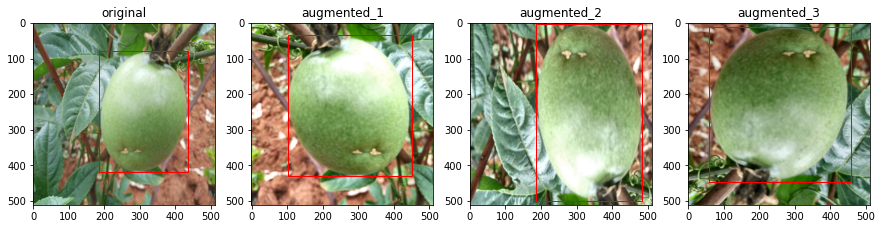

In [61]:
apply_transforms(example_transforms, all_train_images, n_transforms=3)

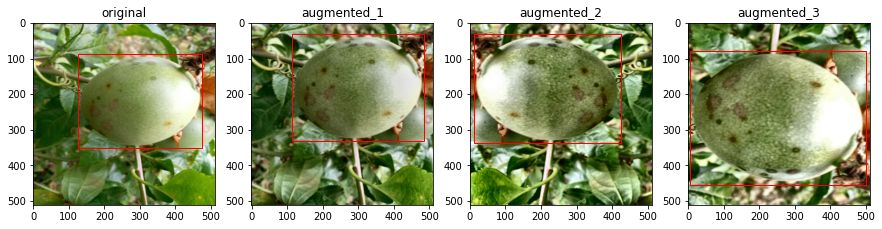

In [62]:
apply_transforms(example_transforms, all_train_images, n_transforms=3)

#### Note how clahe emphasizes the dark spots its a must have for this project

# EDA PART TWO 
### In the earlier part we were looking at things concerning the bounding boxes and the whole image itself
### Here we are going to look at the various classes of the diseases 

In [66]:
from pathlib import Path


def list_files(path:Path):
    return [o for o in path.iterdir()]

In [67]:
path = Path('../input/makerere-fruit-passion/New Makerere/Train_Images(1)/')
df_path = Path('../input/makerere-fruit-passion/New Makerere/')
im_sz = 512
bs = 16

In [68]:
train_fnames = list_files(path/'Train_Images')
df = pd.read_csv(df_path/'Train(1).csv')
df.head()

,Image_ID,class,xmin,ymin,width,height
0,ID_007FAIEI,fruit_woodiness,87.0,87.5,228.0,311.0
1,ID_00G8K1V3,fruit_brownspot,97.5,17.5,245.0,354.5
2,ID_00WROUT9,fruit_brownspot,156.5,209.5,248.0,302.5
3,ID_00ZJEEK3,fruit_healthy,125.0,193.0,254.5,217.0
4,ID_018UIENR,fruit_brownspot,79.5,232.5,233.5,182.0


In [72]:
df['class'].value_counts(),df.shape

(fruit_healthy      1638
 fruit_woodiness    1246
 fruit_brownspot    1022
 Name: class, dtype: int64,
 (3906, 6))

#### The class are not balanced but we cannot say they are highly imbalanced but still stratified KFold is required

## Visualizing healthy and diseased passion fruits 

Samples which are healthy


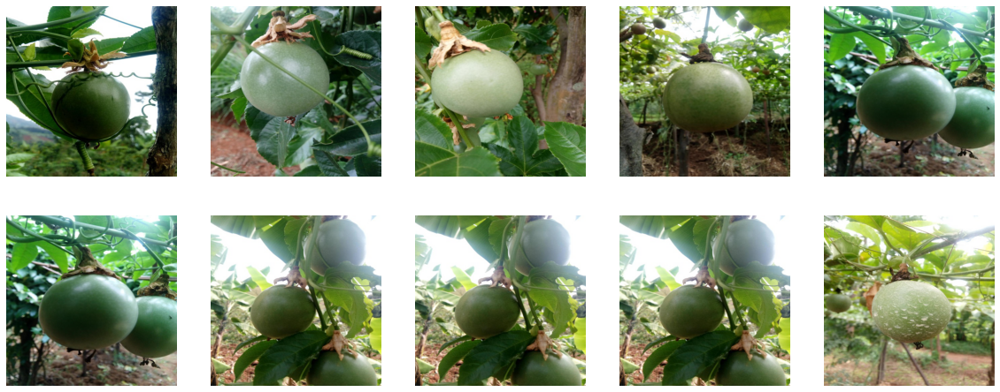

Samples with fruit_woodiness disease


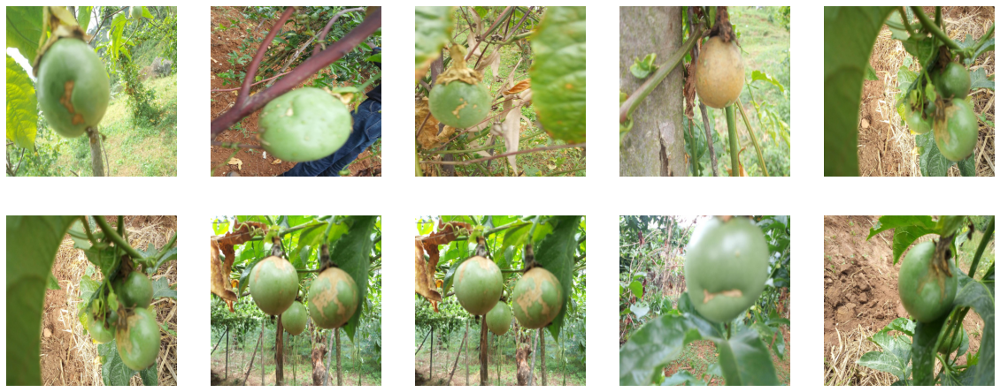

Samples with fruit_brownspot disease


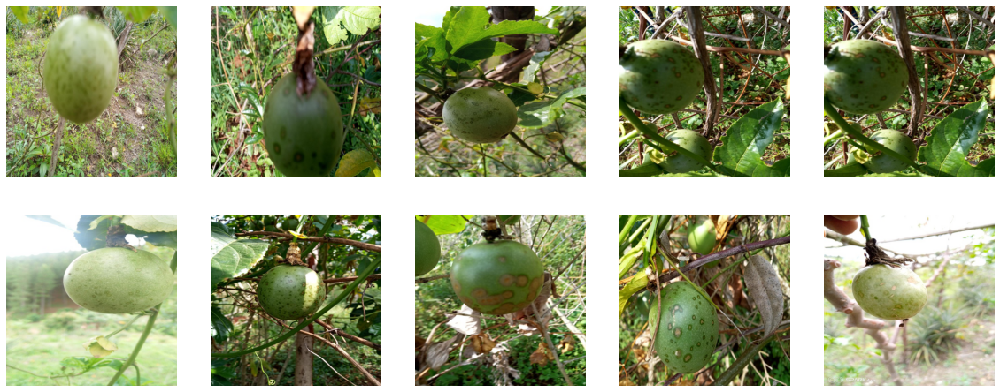

In [75]:


print("Samples which are healthy")
imgs = df[df['class']=='fruit_healthy']['Image_ID'].values
_, axs = plt.subplots(2, 5, figsize=(20, 8))
axs = axs.flatten()
for f_name,ax in zip(imgs[:10],axs):
    img = Image.open(path/f'Train_Images/{f_name}.jpg')
    ax.imshow(img)
    ax.axis('off')
plt.show()

print("Samples with fruit_woodiness disease")
imgs = df[df['class']=='fruit_woodiness']['Image_ID'].values
_, axs = plt.subplots(2, 5, figsize=(20, 8))
axs = axs.flatten()
for f_name,ax in zip(imgs[:10],axs):
    img = Image.open(path/f'Train_Images/{f_name}.jpg')
    ax.imshow(img)
    ax.axis('off')    
plt.show()

print("Samples with fruit_brownspot disease")
imgs = df[df['class']=="fruit_brownspot"]['Image_ID'].values
_, axs = plt.subplots(2, 5, figsize=(20, 8))
axs = axs.flatten()
for f_name,ax in zip(imgs[:10],axs):
    img = Image.open(path/f'Train_Images/{f_name}.jpg')
    ax.imshow(img)
    ax.axis('off')    
plt.show()


## Conclusion


*     Images are taken at different zoom levels. Crop and resize data augmentations to be used for model training.
*     Images are taken at various lighting conditions. Special filters should be used to address that.
*     Bounding boxes are okay!


